# Import Libraries

In [1]:
import os
import time
import pickle
import random
import itertools

# Analisi dati e Visualizzazione
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn: Preprocessing e Dimensionality Reduction
from sklearn.preprocessing import (
    MinMaxScaler,
    StandardScaler,
    LabelEncoder,
    OneHotEncoder
)
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.utils.class_weight import compute_class_weight

# Scikit-learn: Model Selection e Pipeline
from sklearn.model_selection import (
    train_test_split,
    PredefinedSplit,
    GridSearchCV,
    RandomizedSearchCV,
    ParameterGrid
)
from sklearn.pipeline import Pipeline

# Scikit-learn: Modelli di Machine Learning Classico
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import plot_tree

# Imbalanced Learning (SMOTE e Pipeline compatibile)
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Metriche di Valutazione
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    roc_auc_score,
    roc_curve,
    PrecisionRecallDisplay
)

# Deep Learning (PyTorch) e Monitoraggio
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

import datetime

from support_modules.utils import *
from support_modules.plot import *

# Global Variables

In [2]:
seed = 42
FILENAME = "../data/train.csv"

# Load the dataset

In [3]:
df = pd.read_csv(FILENAME, encoding='ISO-8859-1', sep=",")

rows = df.shape[0]
cols = df.shape[1]
print("# Righe: " + str(rows)+ " # Colonne: "+str(cols) + "\n")

# Righe: 148301 # Colonne: 145



# Preprocessing

## 1. Remove duplicates rows and columns

In [4]:
# Individua se esistono colonne con lo stesso nome
# Se esistono, allora se le colonne sono duplicati perfetti, droppiamo il duplicato
# Se esistono, ma nono sono perfetti duplicati, per intervenire consciamente sarebbe necessario avere maggior domain knowledge
feature_list = df.columns.to_list()
has_duplicate_cols = len(feature_list) != len(set(feature_list))
print("Ci sono colonne con lo stesso nome?", has_duplicate_cols)

if has_duplicate_cols:
    df.T.drop_duplicates(inplace=True).T


# Rimuovi righe duplicate
df.drop_duplicates(inplace=True)


##################################################
print("Nuovo # Righe: " + str(rows)+ " Nuovo # Colonne: "+str(cols) + "\n")

Ci sono colonne con lo stesso nome? False
Nuovo # Righe: 148301 Nuovo # Colonne: 145



## 2. Label extraction

In [5]:
X = df.drop(columns=["grade"])
y = df["grade"]

In [6]:
# Split train test: 0.25
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, stratify=y, random_state=seed)

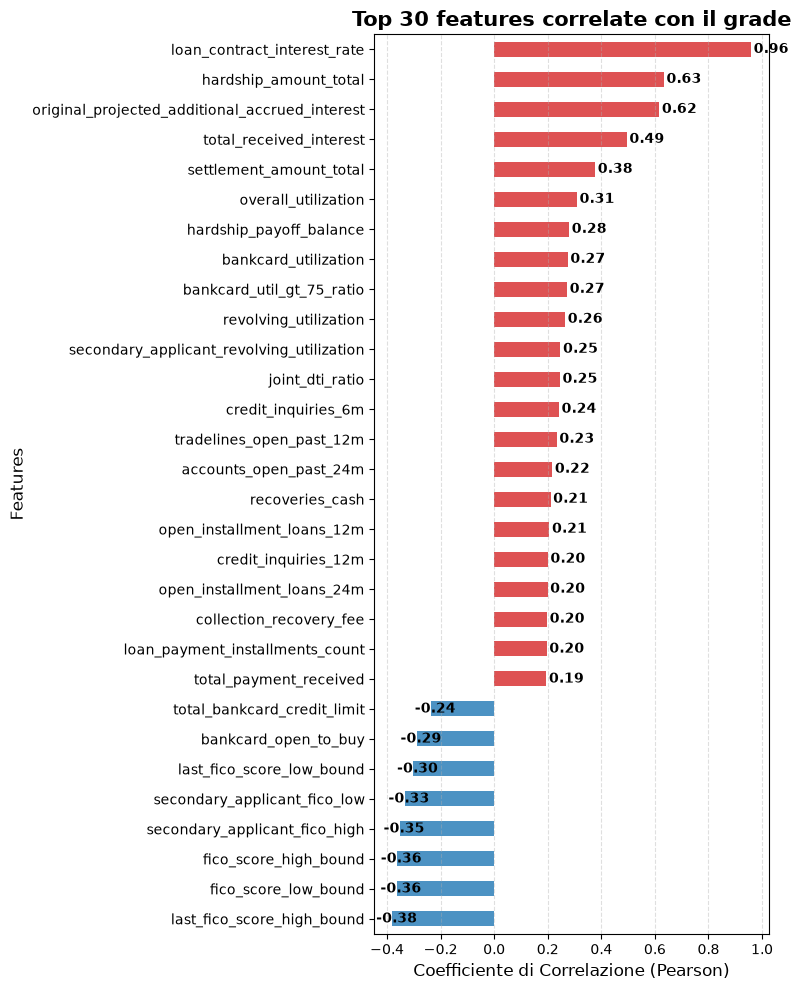

In [7]:
plot_top_correlations_split(X, y, 30)

/scratch.hpc/gabriele.aprile2/loan-risk-rating-prediction/src/support_modules/plot.py:461: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


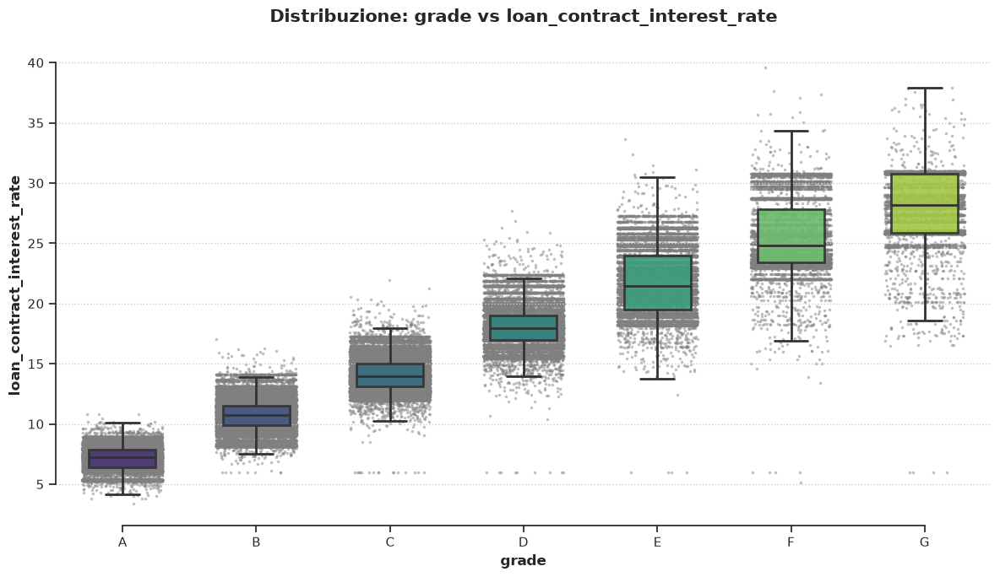

In [8]:
plot_leakage_evidence(y, X['loan_contract_interest_rate'])

## 3. Data visualization

In [9]:
print_nan(df, sort_by='perc', show_values=False)

Colonne con almeno un NaN: 144/145 (99.31%)
------------------------------------------------------------
Feature                                           Type     Nan   Percentuale NaN (%)  Uniques Count
   original_projected_additional_accrued_interest float64 147655 99.56%                 640        
                       hardship_loan_status_label     str 147460 99.43%                   5        
                                hardship_end_date     str 147458 99.43%                  28        
                              hardship_type_label     str 147458 99.43%                   1        
                           hardship_duration_days float64 147457 99.43%                  65        
               hardship_last_payment_amount_total float64 147457 99.43%                 824        
                           hardship_days_past_due float64 147457 99.43%                  99        
                            hardship_reason_label     str 147456 99.43%                   9    

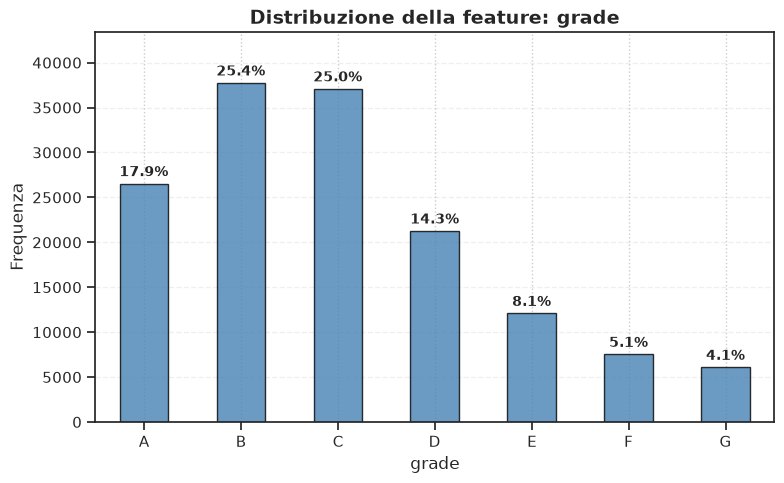

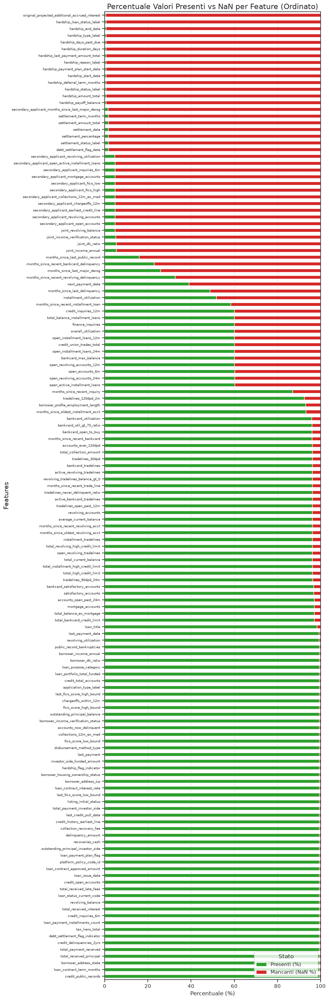

In [10]:
plot_feature_distribution(y, "grade")
plot_nan(X)

In [42]:
plot_feature_distribution(y)train, "grade")
plot_nan(X_train)

SyntaxError: unmatched ')' (2950125418.py, line 1)

In [11]:
settlement_data_leakage = [col for col in X.columns if 'settlement' in col]
print(settlement_data_leakage)

['debt_settlement_flag_indicator', 'debt_settlement_flag_date', 'settlement_status_label', 'settlement_date', 'settlement_amount_total', 'settlement_percentage', 'settlement_term_months']


In [12]:
hardship_data_leakage = [col for col in X.columns if 'hardship' in col]
print(hardship_data_leakage)

['hardship_flag_indicator', 'hardship_type_label', 'hardship_reason_label', 'hardship_status_label', 'hardship_deferral_term_months', 'hardship_amount_total', 'hardship_start_date', 'hardship_end_date', 'hardship_payment_plan_start_date', 'hardship_duration_days', 'hardship_days_past_due', 'hardship_loan_status_label', 'hardship_payoff_balance', 'hardship_last_payment_amount_total']


In [13]:
joint_and_secondary_cols = [col for col in df.columns if col.startswith('joint_') or col.startswith('secondary_')]
print(joint_and_secondary_cols)

['joint_income_annual', 'joint_dti_ratio', 'joint_income_verification_status', 'joint_revolving_balance', 'secondary_applicant_fico_low', 'secondary_applicant_fico_high', 'secondary_applicant_earliest_credit_line', 'secondary_applicant_inquiries_6m', 'secondary_applicant_mortgage_accounts', 'secondary_applicant_open_accounts', 'secondary_applicant_revolving_utilization', 'secondary_applicant_open_active_installment_loans', 'secondary_applicant_revolving_accounts', 'secondary_applicant_chargeoffs_12m', 'secondary_applicant_collections_12m_ex_med', 'secondary_applicant_months_since_last_major_derog']


## 4. Features manipulation

In [14]:
for i in X.dtypes.unique():
    print("Type", i)

Type float64
Type str


### Drop leakage and non significant features

In [15]:
loan_performance_data_leakage = [
    'loan_status_current_code',                         # prestito in regola, in ritardo, totalmente pagato...
    'outstanding_principal_balance',                    # "outstanding principal" e' la parte del capitale da restituire
    'outstanding_principal_investor_side',              # similmente
    'total_payment_received',                           # somma pagata al creditore
    'total_payment_investor_side',
    'total_received_principal',                         # somma pagata al creditore che copre la il capitale del prestito
    'total_received_interest',                          # ... copre gli interessi
    'total_received_late_fees',                         # ... copre le penali
    'recoveries_cash',                                  # somma recuperata dopo un prestito andato in default
    'collection_recovery_fee',                          # spese per il recupero crediti
    'last_payment_date',                                # data ultimo pagamento effettuato
    'last_payment',                                     # importo ultimo pagamento
    'next_payment_date',                                # data prossimo pagamento
    'last_credit_pull_date',                            # data ultimo check profilo creditizio, durante il periodo di prestito
    'last_fico_score_high_bound',                       # ultimo punteggio FICO rilevato: al momento della concessione del prestito si usa 'fico_score_low_bound', 'fico_score_high_bound
    'last_fico_score_low_bound',
    'total_collection_amount',
    'loan_payment_installments_count'                   # potrebbe semprare il numero di rate, ma la tipologia di valori contenuti fa pensare al valore economico della singola rata (calcolo derivante di interest rate)
]


other_leakage = [
    'original_projected_additional_accrued_interest',           # interesse addizionale previsto, presumibilmente in seguito a modifiche di piani ammortamento o hardship
    #'loan_issue_date',                                         # Il grade è influenzato dalla situazione creditizia del richiedente, più che dal periodo
                                                                # droppato in un secondo momento, dopo averlo usato per feature extraction
    'investor_side_funded_amount',
    'loan_portfolio_total_funded',
]


# Il tasso di interesse di un prestito è calcolato basandosi sul Grading assegnato al prestito stesso.
# Essendo una conseguenza del nostro target "grade", è da considerarsi data leakage
# https://www.airtel.in/blog/personal-loan/how-does-loan-grading-work/ (Accessed 02/02/2026)
loan_contract_interest_rate = [
    'loan_contract_interest_rate'
]

# DROP OPERATIONS
X_train.drop(columns=loan_performance_data_leakage, inplace=True)
X_val.drop(columns=loan_performance_data_leakage, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

X_train.drop(columns=settlement_data_leakage, inplace=True)
X_val.drop(columns=settlement_data_leakage, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

X_train.drop(columns=hardship_data_leakage, inplace=True)
X_val.drop(columns=hardship_data_leakage, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

X_train.drop(columns=other_leakage, inplace=True)
X_val.drop(columns=other_leakage, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

X_train.drop(columns=loan_contract_interest_rate, inplace=True)
X_val.drop(columns=loan_contract_interest_rate, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")



Nuovo # Colonne: 126

Nuovo # Colonne: 119

Nuovo # Colonne: 105

Nuovo # Colonne: 102

Nuovo # Colonne: 101



In [16]:
other_non_significant = [
    'platform_policy_code_id',                                      # id interno al prestatore
    'loan_title',                                                   # non significant column, grande sparsita' di dati. Sufficiente loan_purpose_category come aggregazione di scopo del prestito
    'borrower_address_zip',                                         # non significant column, esiste una colonna per identificazione stati
]

X_train.drop(columns=other_non_significant, inplace=True)
X_val.drop(columns=other_non_significant, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

Nuovo # Colonne: 98



In [17]:

joint_and_secondary_cols = [col for col in df.columns if col.startswith('joint_') or col.startswith('secondary_')]
for col in joint_and_secondary_cols:
    print(col)

joint_income_annual
joint_dti_ratio
joint_income_verification_status
joint_revolving_balance
secondary_applicant_fico_low
secondary_applicant_fico_high
secondary_applicant_earliest_credit_line
secondary_applicant_inquiries_6m
secondary_applicant_mortgage_accounts
secondary_applicant_open_accounts
secondary_applicant_revolving_utilization
secondary_applicant_open_active_installment_loans
secondary_applicant_revolving_accounts
secondary_applicant_chargeoffs_12m
secondary_applicant_collections_12m_ex_med
secondary_applicant_months_since_last_major_derog


### Drop "secondary" and "joint" features

In [18]:
# colonne con grande quantità di nan sono state droppate al passo precedente, terminiamo pulizia qui di eventuali rimanenti
# application_type_label ci informa gia' se il tipo di prestito e' individual o joint
print(X['application_type_label'].unique())
print("\napplication_type_label nan", (X['application_type_label'].isna().sum())/X.shape[0], "%")

joint_and_secondary_cols = [col for col in X_train.columns if col.startswith('joint_') or col.startswith('secondary_')]
print(joint_and_secondary_cols)

<StringArray>
['individual', 'joint app', nan]
Length: 3, dtype: str

application_type_label nan 0.00665538330827169 %
['joint_income_annual', 'joint_dti_ratio', 'joint_income_verification_status', 'joint_revolving_balance', 'secondary_applicant_fico_low', 'secondary_applicant_fico_high', 'secondary_applicant_earliest_credit_line', 'secondary_applicant_inquiries_6m', 'secondary_applicant_mortgage_accounts', 'secondary_applicant_open_accounts', 'secondary_applicant_revolving_utilization', 'secondary_applicant_open_active_installment_loans', 'secondary_applicant_revolving_accounts', 'secondary_applicant_chargeoffs_12m', 'secondary_applicant_collections_12m_ex_med', 'secondary_applicant_months_since_last_major_derog']


In [19]:
X_train.drop(columns=joint_and_secondary_cols, inplace=True)
X_val.drop(columns=joint_and_secondary_cols, inplace=True)
print("\nNuovo # Colonne: " +  str(X_train.shape[1]) + "\n")


Nuovo # Colonne: 82



### Drop high Nan features

In [20]:
print_high_nan_columns(X_train, 0.90)

Nessuna colonna rimossa.


In [21]:
# TODO esportare in funzione?
nan_ratio = X_train.isna().mean()
high_nan_cols = nan_ratio[nan_ratio > 0.90].index.tolist()
print(f"Colonne rimosse (> 90% NaN): {high_nan_cols}")

X_train = X_train.drop(columns=high_nan_cols)
X_val = X_val.drop(columns=high_nan_cols)

print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

Colonne rimosse (> 90% NaN): []
Nuovo # Colonne: 82



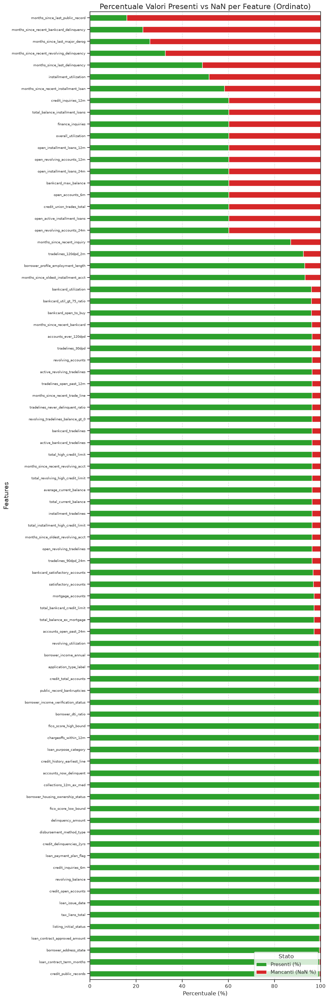

In [22]:
plot_nan(X_train)

### Drop highly correlated numeric features

In [23]:
redundant_features = print_highly_correlated_numeric_features(X_train, threshold=0.95)

--- Colonne con correlazione assoluta >= 0.95 ---
revolving_tradelines_balance_gt_0 correla con: active_revolving_tradelines (+0.98)
satisfactory_accounts correla con: credit_open_accounts (+1.00)
total_high_credit_limit correla con: total_current_balance (+0.98)
total_installment_high_credit_limit correla con: total_balance_installment_loans (+0.95)


In [24]:
# Lista delle feature ridondanti identificate (High Correlation > 0.90-0.95)
print(redundant_features)

# Esegui il drop
X_train.drop(columns=redundant_features, inplace=True)
X_val.drop(columns=redundant_features, inplace=True)
print("\nNuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

['revolving_tradelines_balance_gt_0', 'satisfactory_accounts', 'total_high_credit_limit', 'total_installment_high_credit_limit']

Nuovo # Colonne: 78



### Feature extraction

In [25]:
# Trasforma "36 months" e "60 months" in float type
print(X_train['loan_contract_term_months'].unique(), "\n")
X_train['loan_contract_term_months'] = X_train['loan_contract_term_months'].str.extract(r'(\d+)').astype(float)
X_val['loan_contract_term_months'] = X_val['loan_contract_term_months'].str.extract(r'(\d+)').astype(float)
print(X_train['loan_contract_term_months'].unique(), "\n",)

# Strip della stringa "years"
# Trasforma anni in float: < 1 diventa 0, 10+ diventa 10
print(X_train['borrower_profile_employment_length'].unique(), "\n",)
X_train['borrower_profile_employment_length'] = X_train['borrower_profile_employment_length'].str.replace(r'\+? years?', '', regex=True)
X_train['borrower_profile_employment_length'] = X_train['borrower_profile_employment_length'].replace({ '< 1': 0}).astype(float)
X_val['borrower_profile_employment_length'] = X_val['borrower_profile_employment_length'].str.replace(r'\+? years?', '', regex=True)
X_val['borrower_profile_employment_length'] = X_val['borrower_profile_employment_length'].replace({ '< 1': 0}).astype(float)
print(X_train['borrower_profile_employment_length'].unique(), "\n",)


<StringArray>
[' 36 months', ' 60 months', nan]
Length: 3, dtype: str 

[36. 60. nan] 

<StringArray>
['10+ years',   '6 years',   '2 years',    '1 year',   '4 years',         nan,
   '9 years',   '5 years',  '< 1 year',   '8 years',   '7 years',   '3 years']
Length: 12, dtype: str 

[10.  6.  2.  1.  4. nan  9.  5.  0.  8.  7.  3.] 



In [26]:
# Tutte le features rimanenti con date non sono rilevanti (leakage)
date_cols = [col for col in X_train.columns if 'date' in col]
print(date_cols)

['loan_issue_date']


In [27]:
# FICO average da fico_score_low_bound e fico_score_high_bound
X_train['fico_average'] = (X_train['fico_score_low_bound'] + X_train['fico_score_high_bound']) / 2
X_val['fico_average'] = (X_val['fico_score_low_bound'] + X_val['fico_score_high_bound']) / 2

X_train.drop(columns=['fico_score_low_bound', 'fico_score_high_bound'], inplace=True)
X_val.drop(columns=['fico_score_low_bound', 'fico_score_high_bound'], inplace=True)
print("\nNuovo # Colonne: " +  str(X_train.shape[1]) + "\n")


##### DATE #####
X_train['loan_issue_date'] = pd.to_datetime(X_train['loan_issue_date'], format='%b-%Y')
X_val['loan_issue_date'] = pd.to_datetime(X_val['loan_issue_date'], format='%b-%Y')
X_train['credit_history_earliest_line'] = pd.to_datetime(X_train['credit_history_earliest_line'], format='%b-%Y')
X_val['credit_history_earliest_line'] = pd.to_datetime(X_val['credit_history_earliest_line'], format='%b-%Y')

# Numero mesi passati tra prima richiesta credito e loan date
X_train['months_since_credit_history_earliest_line'] = (
    (X_train['loan_issue_date'].dt.year - X_train['credit_history_earliest_line'].dt.year) * 12 +
    (X_train['loan_issue_date'].dt.month - X_train['credit_history_earliest_line'].dt.month)
)

X_val['months_since_credit_history_earliest_line'] = (
    (X_val['loan_issue_date'].dt.year - X_val['credit_history_earliest_line'].dt.year) * 12 +
    (X_val['loan_issue_date'].dt.month - X_val['credit_history_earliest_line'].dt.month)
)

to_drop = [
    'credit_history_earliest_line',     # usata per feature extraction
    ] + date_cols


X_train.drop(columns=to_drop, inplace=True)
X_val.drop(columns=to_drop, inplace=True)
print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")


Nuovo # Colonne: 77

Nuovo # Colonne: 76



### Rounding features that should be integer

In [28]:
col_number = X_train.select_dtypes(include=[np.number])
for col in col_number:
    print(col)

loan_contract_approved_amount
loan_contract_term_months
borrower_profile_employment_length
borrower_income_annual
borrower_dti_ratio
credit_delinquencies_2yrs
credit_inquiries_6m
months_since_last_delinquency
months_since_last_public_record
credit_open_accounts
credit_public_records
revolving_balance
revolving_utilization
credit_total_accounts
collections_12m_ex_med
months_since_last_major_derog
accounts_now_delinquent
total_current_balance
open_accounts_6m
open_active_installment_loans
open_installment_loans_12m
open_installment_loans_24m
months_since_recent_installment_loan
total_balance_installment_loans
installment_utilization
open_revolving_accounts_12m
open_revolving_accounts_24m
bankcard_max_balance
overall_utilization
total_revolving_high_credit_limit
finance_inquiries
credit_union_trades_total
credit_inquiries_12m
accounts_open_past_24m
average_current_balance
bankcard_open_to_buy
bankcard_utilization
chargeoffs_within_12m
delinquency_amount
months_since_oldest_installment_acc

In [29]:

# Lista delle feature che richiedono valori interi: conteggi di linee di credito e conti, mesi, fico score
round_to_nearest_int = [
    # Months
    'loan_contract_term_months',
    'months_since_last_delinquency',
    'months_since_last_public_record',
    'months_since_last_major_derog',
    'months_since_recent_installment_loan',
    'months_since_oldest_installment_acct',
    'months_since_oldest_revolving_acct',
    'months_since_recent_revolving_acct',
    'months_since_recent_trade_line',
    'months_since_recent_bankcard',
    'months_since_recent_bankcard_delinquency',
    'months_since_recent_inquiry',
    'months_since_recent_revolving_delinquency',
    'months_since_credit_history_earliest_line',

    # account, eventi, inquiry, delinquency
    'credit_delinquencies_2yrs',
    'credit_inquiries_6m',
    'credit_open_accounts',
    'credit_public_records',
    'collections_12m_ex_med',
    'accounts_now_delinquent',
    'open_accounts_6m',
    'open_active_installment_loans',
    'open_installment_loans_12m',
    'open_installment_loans_24m',
    'open_revolving_accounts_12m',
    'open_revolving_accounts_24m',
    'finance_inquiries',
    'credit_union_trades_total',
    'credit_inquiries_12m',
    'accounts_open_past_24m',
    'chargeoffs_within_12m',
    'mortgage_accounts',
    'accounts_ever_120dpd',
    'active_bankcard_tradelines',
    'active_revolving_tradelines',
    'bankcard_satisfactory_accounts',
    'bankcard_tradelines',
    'installment_tradelines',
    'open_revolving_tradelines',
    'revolving_accounts',
    'tradelines_120dpd_2m',
    'tradelines_30dpd',
    'tradelines_90dpd_24m',
    'tradelines_open_past_12m',
    'public_record_bankruptcies',
    'tax_liens_total',

    'borrower_profile_employment_length',
    'fico_average'

]

# Esempio di utilizzo:
X_train = round_features_to_int(X_train, round_to_nearest_int)
X_val = round_features_to_int(X_val, round_to_nearest_int)

## 5. NaN imputing

In [30]:
col_number = X_train.select_dtypes(include=['object'])
for col in col_number:
    print(col)

borrower_housing_ownership_status
borrower_income_verification_status
loan_payment_plan_flag
loan_purpose_category
borrower_address_state
listing_initial_status
application_type_label
disbursement_method_type


/scratch.hpc/gabriele.aprile2/tmp/ipykernel_2428290/3232811312.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  col_number = X_train.select_dtypes(include=['object'])


In [31]:
col_number = X_train.select_dtypes(include=[np.number])
for col in col_number:
    print(col)

loan_contract_approved_amount
loan_contract_term_months
borrower_profile_employment_length
borrower_income_annual
borrower_dti_ratio
credit_delinquencies_2yrs
credit_inquiries_6m
months_since_last_delinquency
months_since_last_public_record
credit_open_accounts
credit_public_records
revolving_balance
revolving_utilization
credit_total_accounts
collections_12m_ex_med
months_since_last_major_derog
accounts_now_delinquent
total_current_balance
open_accounts_6m
open_active_installment_loans
open_installment_loans_12m
open_installment_loans_24m
months_since_recent_installment_loan
total_balance_installment_loans
installment_utilization
open_revolving_accounts_12m
open_revolving_accounts_24m
bankcard_max_balance
overall_utilization
total_revolving_high_credit_limit
finance_inquiries
credit_union_trades_total
credit_inquiries_12m
accounts_open_past_24m
average_current_balance
bankcard_open_to_buy
bankcard_utilization
chargeoffs_within_12m
delinquency_amount
months_since_oldest_installment_acc

In [32]:
# Feature categoriche in cui i valori NaN sono riempiti con una nuova label Unknown
categorical_to_unknown_cols = [
  'borrower_address_state',
  'loan_purpose_category',
  'borrower_income_verification_status',
  'borrower_housing_ownership_status'
]

# Fill con 'unknown'
X_train[categorical_to_unknown_cols] = X_train[categorical_to_unknown_cols].fillna('unknown')
X_val[categorical_to_unknown_cols] = X_val[categorical_to_unknown_cols].fillna('unknown')


# NaN = Mai successo
# Fill con numero elevato => 999 = molto tempo fa / mai
fill_big_cols = [
    'months_since_last_public_record',
    'months_since_recent_bankcard_delinquency',
    'months_since_last_major_derog',
    'months_since_recent_revolving_delinquency',
    'months_since_last_delinquency', 
    'months_since_recent_inquiry', 
    'months_since_recent_bankcard',
    'months_since_recent_trade_line'
]

X_train[fill_big_cols] = X_train[fill_big_cols].fillna(999)
X_val[fill_big_cols] = X_val[fill_big_cols].fillna(999)


# 2. FILL con 0 (se non e' presente, allora equivale a mai/nessuno -> 0)
fill_zero_cols = [
    'open_accounts_6m', 'open_installment_loans_12m', 'open_installment_loans_24m',
    'open_revolving_accounts_12m', 'open_revolving_accounts_24m',
    'finance_inquiries', 'credit_inquiries_12m', 'credit_union_trades_total',
    'open_active_installment_loans', 'tradelines_open_past_12m', 'accounts_open_past_24m',
    'open_revolving_tradelines', 'active_bankcard_tradelines', 'installment_tradelines',
    'revolving_accounts', 'bankcard_satisfactory_accounts', 'active_revolving_tradelines', 
    'bankcard_tradelines', 'credit_open_accounts', 'credit_total_accounts',
    'tradelines_120dpd_2m', 'tradelines_30dpd', 'tradelines_90dpd_24m',
    'accounts_ever_120dpd', 'chargeoffs_within_12m', 'collections_12m_ex_med',
    'accounts_now_delinquent', 'public_record_bankruptcies', 'credit_public_records',
    'credit_delinquencies_2yrs', 'tax_liens_total', 'borrower_profile_employment_length'

]

X_train[fill_zero_cols] = X_train[fill_zero_cols].fillna(0)
X_val[fill_zero_cols] = X_val[fill_zero_cols].fillna(0)

print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")


Nuovo # Colonne: 76



In [33]:
# Feature categoriche in cui i valori NaN possono essere riempiti con la moda:
# valori con 2 etichette, in cui la mancanza di un dato viene trattato come "no" o come occorrenza piu' frequente
fill_to_mode_cat = [
    'disbursement_method_type',
    'application_type_label',
    'listing_initial_status',
    'loan_payment_plan_flag'         # n/y
]

fill_to_mode_num = [
    'loan_contract_term_months'    # 36/60 mesi
]


cat_imputer = SimpleImputer(strategy='most_frequent')

cat_imputer.fit(X_train[fill_to_mode_cat])

X_train[fill_to_mode_cat] = cat_imputer.transform(X_train[fill_to_mode_cat])
X_val[fill_to_mode_cat]   = cat_imputer.transform(X_val[fill_to_mode_cat])



num_imputer = SimpleImputer(strategy='most_frequent')

num_imputer.fit(X_train[fill_to_mode_num])

X_train[fill_to_mode_num] = num_imputer.transform(X_train[fill_to_mode_num])
X_val[fill_to_mode_num]   = num_imputer.transform(X_val[fill_to_mode_num])

In [34]:
numerical_to_median = X_train.select_dtypes(include=['float', 'int']).columns

imputer = SimpleImputer(strategy='median')

imputer.fit(X_train[numerical_to_median])

X_train[numerical_to_median] = imputer.transform(X_train[numerical_to_median])
X_val[numerical_to_median] = imputer.transform(X_val[numerical_to_median])

In [35]:
print_nan(X_train)
print_nan(X_val)

Colonne con almeno un NaN: 0/76 (0.00%)
------------------------------------------------------------
Nessuna colonna contiene valori NaN.
Colonne con almeno un NaN: 0/76 (0.00%)
------------------------------------------------------------
Nessuna colonna contiene valori NaN.


## 6. Outliers Management

In [36]:
num_cols = X_train.select_dtypes(include=['int64'])
analyze_feature_distributions(num_cols, save_plots=True, output_folder="grafici_explorativi")

Inizio generazione grafici per 0 feature...
Tutti i grafici sono stati salvati in 'grafici_explorativi'.


Inizio generazione grafici per 68 feature...


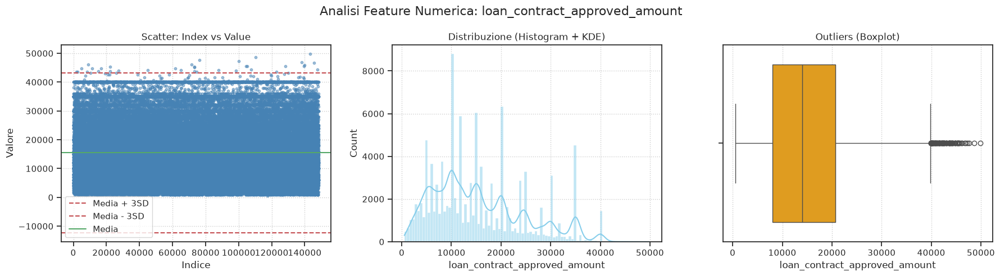

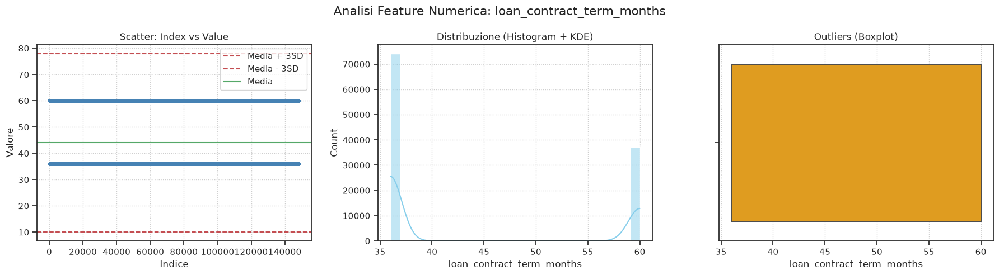

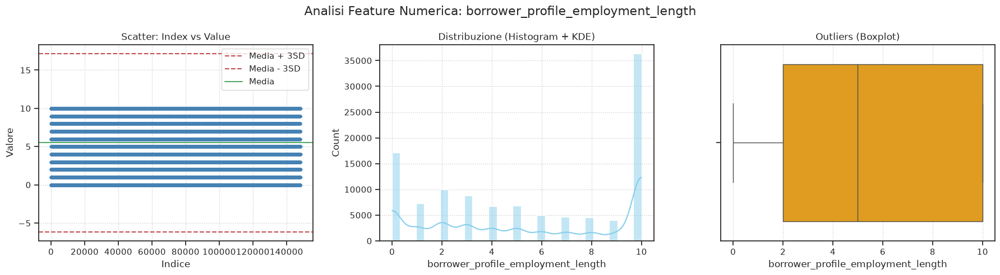

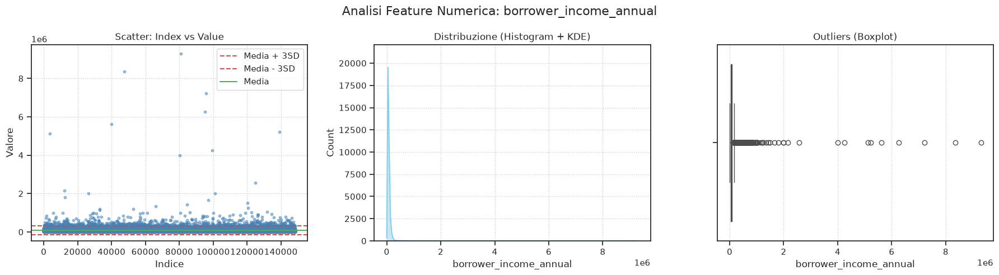

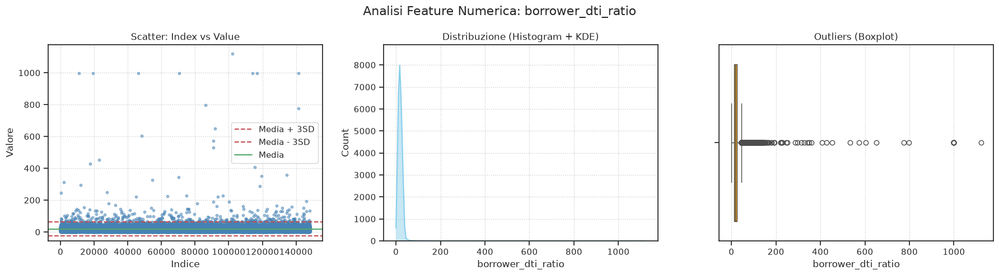

...

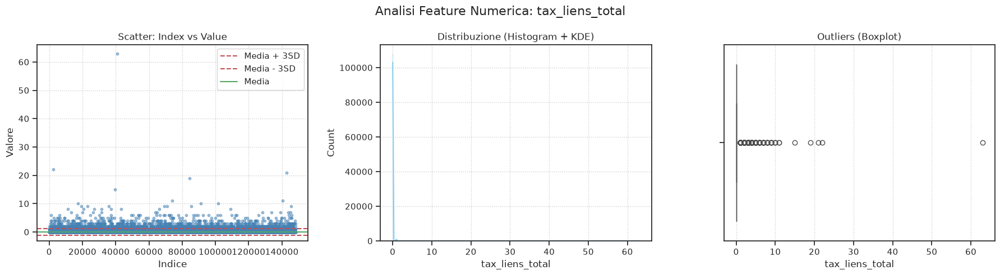

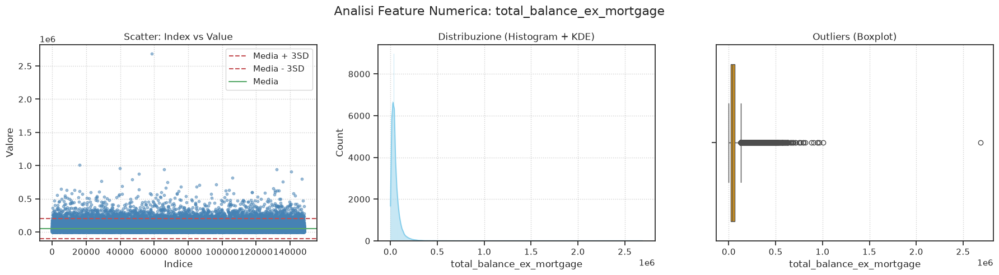

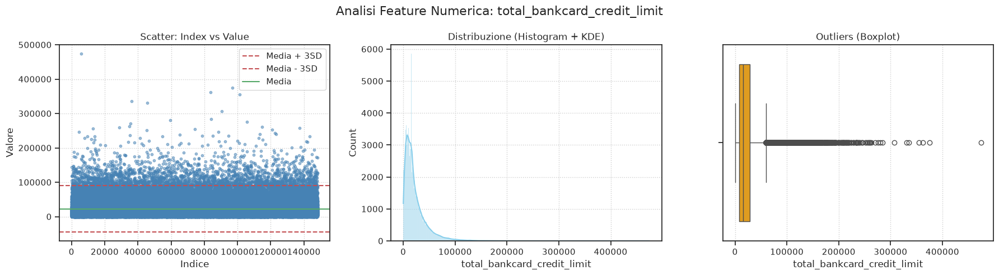

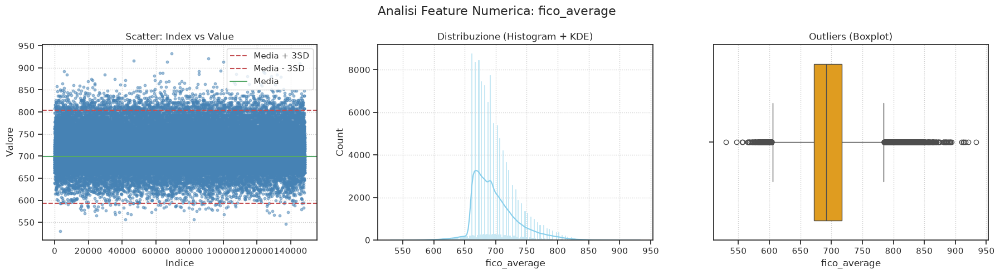

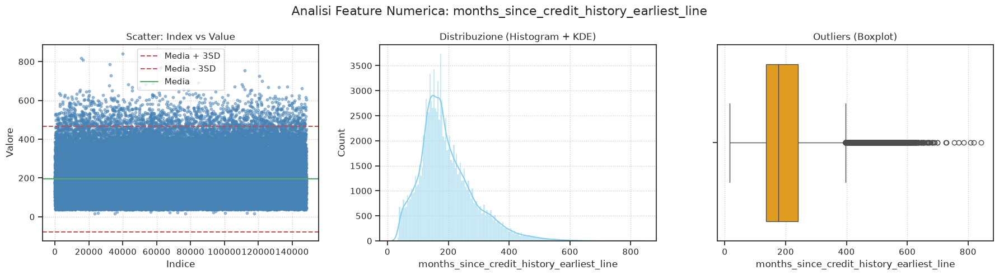

In [37]:
num_cols = X_train.select_dtypes(include=['float'])
analyze_feature_distributions(num_cols, save_plots=False, output_folder="grafici_explorativi")

In [38]:
# TODO esportare in funzione?
numeric_cols = X_train.select_dtypes(include=[np.number]).columns
cap_limits = {
    col: (X_train[col].quantile(0.01), X_train[col].quantile(0.99))
    for col in numeric_cols
}

for col, (lower, upper) in cap_limits.items():
    X_train[col] = X_train[col].clip(lower=lower, upper=upper)
    X_val[col]   = X_val[col].clip(lower=lower, upper=upper)

In [39]:
def handle_skewness(df, threshold=0.75):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    
    skew_values = df[numeric_cols].skew().sort_values(ascending=False)
    skewed_cols = skew_values[abs(skew_values) > threshold].index.tolist()
    
    print(f"Identificate {len(skewed_cols)} feature asimmetriche sopra la soglia {threshold}.")
            
    return skewed_cols

log_features = handle_skewness(X_train, threshold=0.75)

Identificate 52 feature asimmetriche sopra la soglia 0.75.


In [40]:
def apply_log_transform_on_skewed_cols(X, cols):
    for col in cols:
        # Verifica che non ci siano valori negativi prima di applicare il log
        if (X[col] >= 0).all():
            X[col] = np.log1p(X[col])
        else:
            print(f"Salto {col}: contiene valori negativi (impossibile applicare log).")
    
    return

apply_log_transform_on_skewed_cols(X_train, log_features)
apply_log_transform_on_skewed_cols(X_val, log_features)


print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

Nuovo # Colonne: 76



## 7. Features encoding

In [41]:
categorical_features = X_train.select_dtypes(include=['object']).columns.tolist()

ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

ohe.fit(X_train[categorical_features])

X_train_encoded = ohe.transform(X_train[categorical_features])
X_val_encoded = ohe.transform(X_val[categorical_features])

encoded_feature_names = ohe.get_feature_names_out(categorical_features)

X_train_ohe = pd.DataFrame(X_train_encoded,
                           columns=encoded_feature_names,
                           index=X_train.index)
X_val_ohe = pd.DataFrame(X_val_encoded,
                         columns=encoded_feature_names,
                         index=X_val.index)

X_train = X_train.drop(columns=categorical_features).join(X_train_ohe)
X_val = X_val.drop(columns=categorical_features).join(X_val_ohe)


le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_val = le.transform(y_val)

print("Nuovo # Colonne: " +  str(X_train.shape[1]) + "\n")

/scratch.hpc/gabriele.aprile2/tmp/ipykernel_2428290/363523005.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  categorical_features = X_train.select_dtypes(include=['object']).columns.tolist()


Nuovo # Colonne: 154

